In [1]:
import sys
import numpy as np
import scipy.ndimage as nd
import matplotlib.pyplot as plt
from scipy.interpolate import NearestNDInterpolator
from scipy.signal import fftconvolve
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from skimage.measure import regionprops, label, find_contours


def color(filename, loc = False, smoothing=5, n_clusters=5):
    
    Z = plt.imread(filename)#[0:1000, 1000:2000,:]
    n1,n2,n = np.shape(Z)
    plt.figure(figsize =(30,30))
    plt.imshow(Z)
    plt.show()
    image = np.copy(Z)
    
    #Colour transformation
    med_c = np.median(image, axis = -1)

    image = image + (image-med_c[:,:,None])
    image[image>255] = 255
    image[image<0] = 0
    
    plt.figure(figsize =(30,30))
    plt.imshow(image.astype(int))
    plt.show()
    
    for i in range(n):
        if smoothing is not None:
            image[:,:,i] = nd.gaussian_filter(image[:,:,i], sigma=smoothing)
        else:
            image = Z
    X = image.reshape(n1*n2, 3)
    x,y = np.meshgrid(np.arange(n1), np.arange(n2))
    x = x*np.max(X)/np.max(x)
    y = y*np.max(X)/np.max(y)
    
    if loc:
        X = np.concatenate((X, x.flatten()[:, None], y.flatten()[:, None]), axis = 1)

    cluster = KMeans(n_clusters=n_clusters).fit_predict(X)
    labels = np.copy(X[:,0])
    for i in np.unique(cluster):
        X[cluster==i,:] = np.median(X[cluster==i,:], axis=0)
        labels[cluster==i] = i+1
        
    regions = label(labels.reshape(n1,n2))
        
    image = X[:,:3].reshape(n1,n2, n)
    
    return image.astype(int), regions

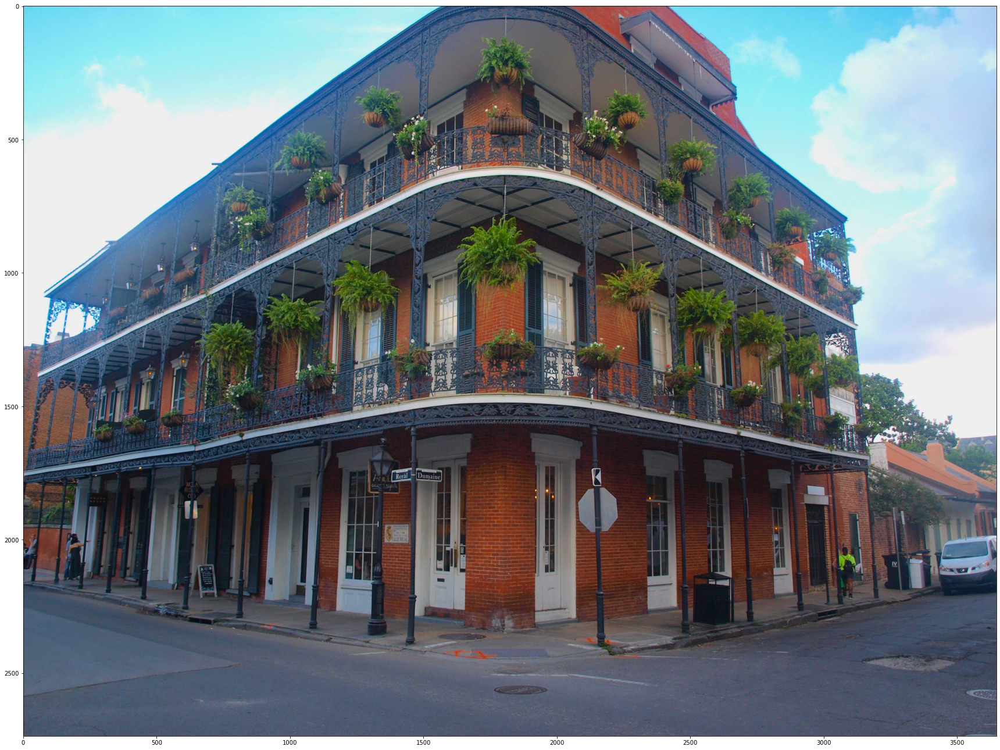

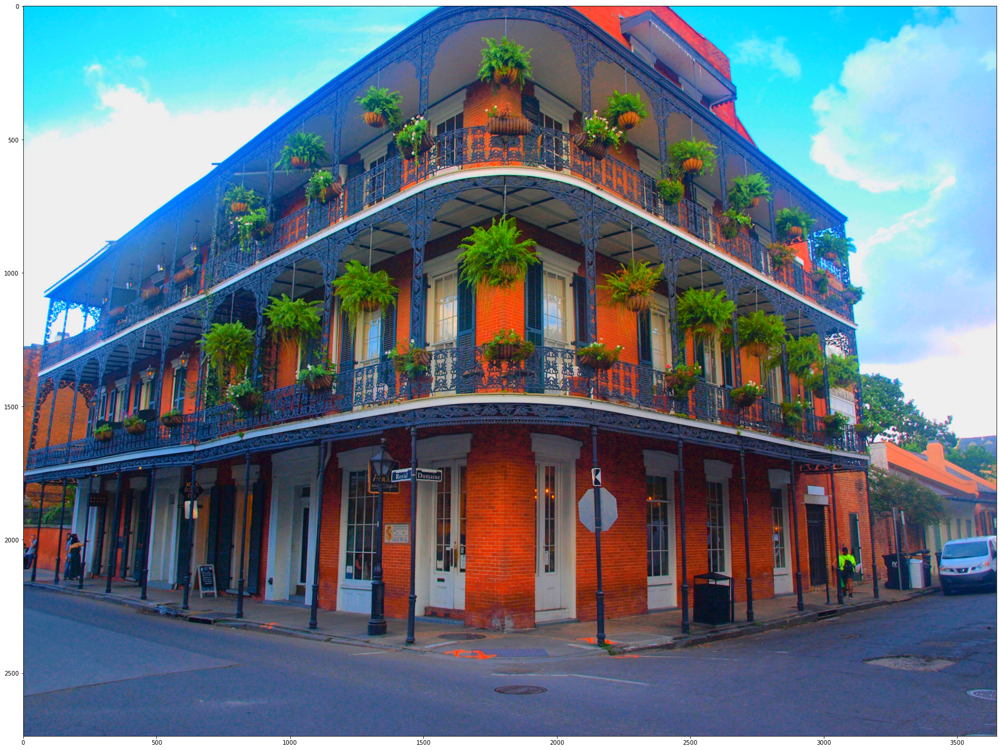

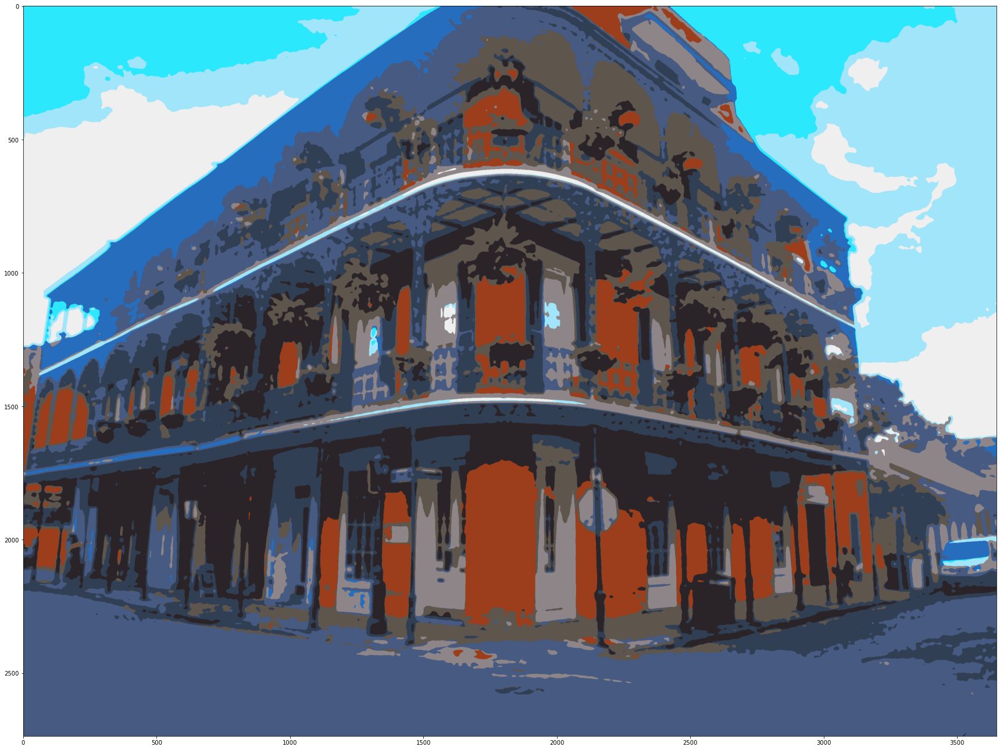

In [7]:
faces = './Face.JPG'
nola = './Nola.JPG'
test = './Test.jpeg'
hard = 'Hard.jpg'
image, labels = color(nola, loc = False, smoothing=5, n_clusters=10)

plt.figure(figsize=(30,30))
plt.imshow(image.astype(int))
plt.show()

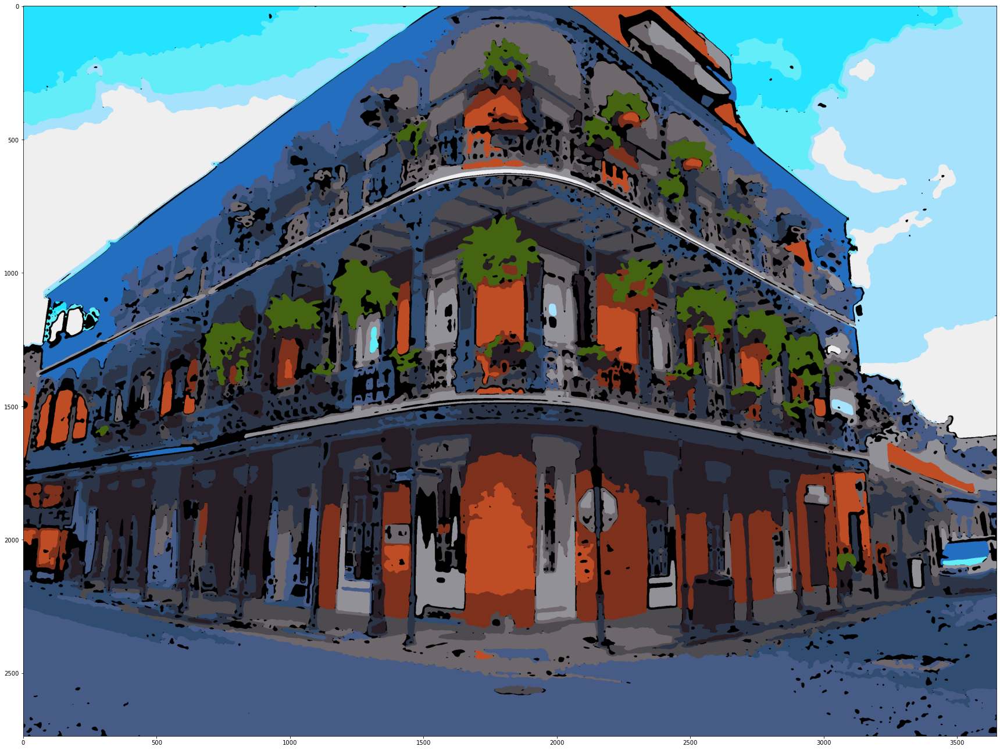

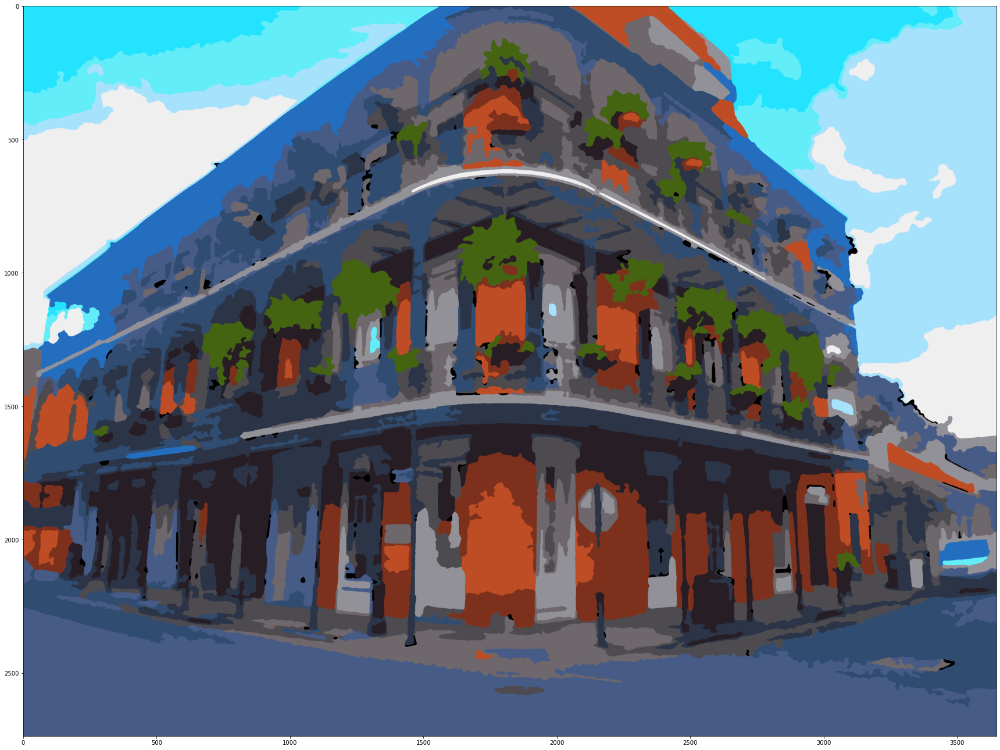

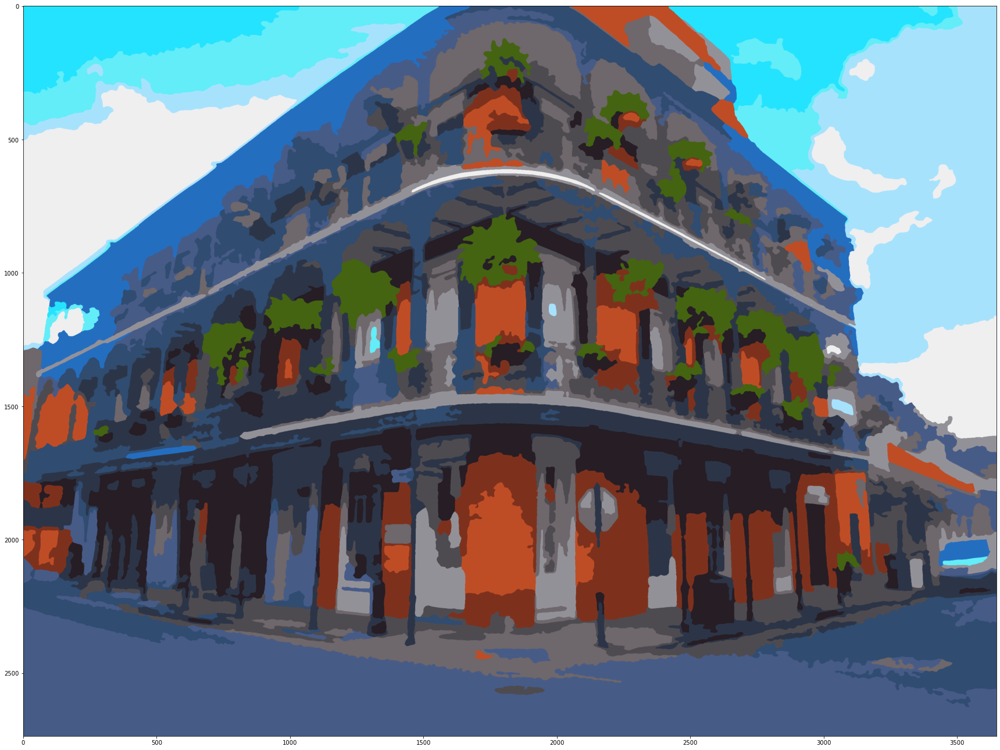

In [3]:
save = np.copy(image)
n1,n2,n = np.shape(image)

rec = 0
#Convex mask to find shape and convex centers
fil = np.ones((int(n1/200), int(n2/200)))

fil[0, :], fil[:,0], fil[-1,:], fil[:,-1] = 0.5, 0.5, 0.5, 0.5
min_area = np.sum(fil)#n1*n2*0.0001

centers = []
regions = regionprops(labels, intensity_image=image)
for r in regions:
    area = r.area
    area_fill = r.filled_area
    i = r.image
    filtered = fftconvolve(i, fil, mode = 'same')

    f_max = np.max(filtered)
    coord = np.where(filtered == f_max)
    
    if filtered[coord[0][0], coord[1][0]] < min_area or area < 5*min_area or (area_fill-area) > area:
        labels[r.coords[:,0], r.coords[:,1]] = 0
        image[r.coords[:,0], r.coords[:,1], :] = 0
    
    string = np.where((filtered<=(5*np.sqrt(min_area))) * (i==1) )
    
    image[string[0]+r.bbox[0], string[1]+r.bbox[1], :] = 0
    labels[string[0]+r.bbox[0], string[1]+r.bbox[1]] = 0
 
plt.figure(figsize=(30,30))
plt.imshow(image.astype(int))
plt.show()

x, y, z = np.where(image != 0)
interp = NearestNDInterpolator(list(zip(x, y, z)), image[x, y, z].flatten())
interp_labels = NearestNDInterpolator(list(zip(x, y)), labels[x, y].flatten())

missing = np.where(image==0)
values = interp(missing)
label_values = interp_labels(missing[:2])
image[missing] = values
labels[missing[0], missing[1]] = label_values

labels = label(labels)
centers = []
regions = regionprops(labels, intensity_image=image)

for r in regions:
    area = r.area
    area_fill = r.filled_area
    i = r.image
    filtered = fftconvolve(i, fil, mode = 'same')

    #f_max = np.max(filtered)
    #coord = np.where(filtered == f_max)
    
    if area < 5*min_area or (area_fill-area) > area:
        labels[r.coords[:,0], r.coords[:,1]] = 0
        image[r.coords[:,0], r.coords[:,1], :] = 0
    
plt.figure(figsize=(30,30))
plt.imshow(image.astype(int))
plt.show()

x, y, z = np.where(image != 0)
interp = NearestNDInterpolator(list(zip(x, y, z)), image[x, y, z].flatten())
interp_labels = NearestNDInterpolator(list(zip(x, y)), labels[x, y].flatten())

missing = np.where(image==0)
values = interp(missing)
label_values = interp_labels(missing[:2])
image[missing] = values.astype(int)
labels[missing[0], missing[1]] = label_values

plt.figure(figsize=(30,30))
plt.imshow(image.astype(int))
plt.show()

In [4]:
regions = regionprops(labels, intensity_image=image.astype(int))
centers = []
fil = np.ones((11,11))
fil[5,5]=2

fil[0, :], fil[:,0], fil[-1,:], fil[:,-1] = 0., 0., 0., 0.
fil /= np.sum(fil)
for r in regions:
    i = r.image
    filtered = fftconvolve(i, fil, mode = 'same')

    f_max = np.max(filtered)
    coord = np.where(filtered == f_max)

    count = 0
    while f_max>=1 and count <20:

        filtered = fftconvolve(filtered, fil, mode = 'same')
        f_max = np.max(filtered)
        coord = np.where(filtered == f_max)
        count+=1
        
    centers.append([coord[0][0]+r.bbox[0], coord[1][0]+r.bbox[1]])


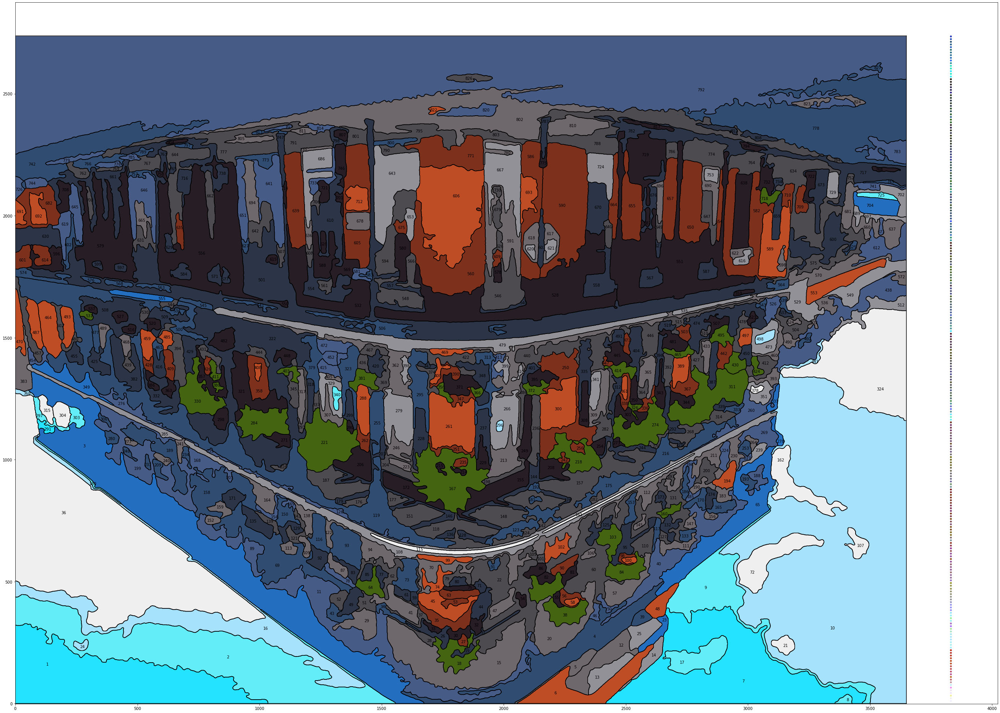

In [6]:
plt.figure(figsize=(n2/100,n1/100))
plt.imshow(image.astype(int))
centers = np.array(centers)

x,y = centers[:, 0], centers[:, 1]#r.weighted_centroid[0][0], r.weighted_centroid[1][0]
count=0
for r in regions:
    contour = find_contours(r.image)
    for c in contour:
        plt.plot(c[:,1]+r.bbox[1], c[:,0]+r.bbox[0], 'k')
    
    plt.text(y[count], x[count], str(r.label), 
             horizontalalignment='center',
             verticalalignment='center')

    count+=1
colours = np.unique(image.astype(int).reshape(n1*n2, 3), axis = 0)
#print(colours)
for i, c in enumerate(colours):
    plt.scatter(n2+n2/20, n1*(len(colours[:,0])-i)/len(colours[:,0]), 
                s=n2/len(colours[:,0]), 
                c = c.astype(int)[None]/255.)
#plt.axis('off')
plt.plot([0,0], [-0.5, n1+1.5], 'k')
plt.plot([n2+1.5,n2+1.5], [-0.5, n1+1.5], 'k')

plt.plot([-0.5, n2+1.5], [0, 0], 'k')
plt.plot([-0.5, n2+1.5],[n1+1.5,n1+1.5], 'k')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig('coloriage.png')
plt.show()